In [176]:
import numpy as np
import pandas as pd
import plotly.graph_objects as Go

In [178]:
#Tiingo API Key
#d4f97a94b2b3d47ecca77ecf4fba8202840835d7

## Gather Data

In [189]:
import requests
from datetime import datetime

api_key = "token=d4f97a94b2b3d47ecca77ecf4fba8202840835d7"
ticker = "aapl"
base_url = "https://api.tiingo.com/tiingo/daily/"
start_date = "startDate=2000-1-1"
current_date = datetime.now().date()
end_date = "endDate=" + str(current_date)
format ="format=csv"

request_url = base_url + ticker + "/prices?" + start_date + "&" + end_date + "&" + format + "&" + api_key

print(request_url)

https://api.tiingo.com/tiingo/daily/aapl/prices?startDate=2000-1-1&endDate=2025-05-01&format=csv&token=d4f97a94b2b3d47ecca77ecf4fba8202840835d7


In [191]:
headers = {'Content-Type': 'application/json'}
requestResponse = requests.get(request_url,
                                    headers=headers)
data = pd.read_csv(request_url)

In [192]:
data

,date,close,high,low,open,volume,adjClose,adjHigh,adjLow,adjOpen,adjVolume,divCash,splitFactor
0,2000-01-03,111.94,112.5000,101.6900,104.870,4783900,0.842092,0.846305,0.764984,0.788907,535797335,0.0,1.0
1,2000-01-04,102.50,110.6200,101.1900,108.250,4574800,0.771078,0.832162,0.761223,0.814333,512378112,0.0,1.0
2,2000-01-05,104.00,110.5600,103.0000,103.750,6949300,0.782362,0.831711,0.774839,0.780481,778322378,0.0,1.0
3,2000-01-06,95.00,107.0000,95.0000,106.120,6856900,0.714657,0.804930,0.714657,0.798310,767973567,0.0,1.0
4,2000-01-07,99.50,101.0000,95.5000,96.500,4113700,0.748510,0.759794,0.718419,0.725942,460734860,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6365,2025-04-24,208.37,208.8299,202.9400,204.890,47310989,208.370000,208.829900,202.940000,204.890000,47310989,0.0,1.0
6366,2025-04-25,209.28,209.7500,206.2000,206.365,38222258,209.280000,209.750000,206.200000,206.365000,38222258,0.0,1.0
6367,2025-04-28,210.14,211.5000,207.4600,210.000,38743074,210.140000,211.500000,207.460000,210.000000,38743074,0.0,1.0
6368,2025-04-29,211.21,212.2400,208.3700,208.693,36827633,211.210000,212.240000,208.370000,208.693000,36827633,0.0,1.0


In [195]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6370 entries, 0 to 6369
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         6370 non-null   object 
 1   close        6370 non-null   float64
 2   high         6370 non-null   float64
 3   low          6370 non-null   float64
 4   open         6370 non-null   float64
 5   volume       6370 non-null   int64  
 6   adjClose     6370 non-null   float64
 7   adjHigh      6370 non-null   float64
 8   adjLow       6370 non-null   float64
 9   adjOpen      6370 non-null   float64
 10  adjVolume    6370 non-null   int64  
 11  divCash      6370 non-null   float64
 12  splitFactor  6370 non-null   float64
dtypes: float64(10), int64(2), object(1)
memory usage: 647.1+ KB


In [197]:
data["date"] = pd.to_datetime(data["date"])

## Data Visualisation 

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



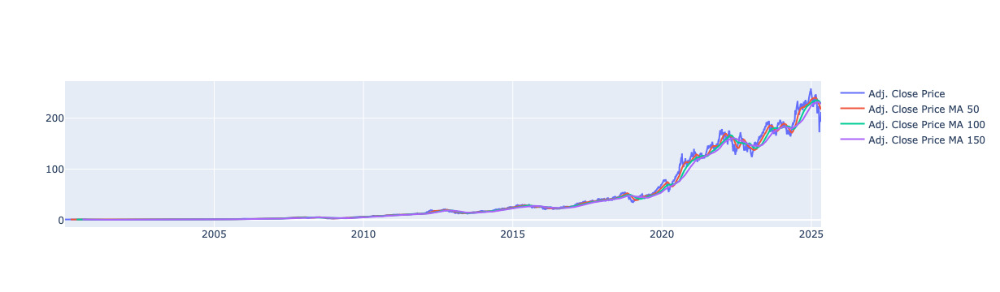

In [317]:
fig = Go.Figure()
#fig.add_trace(Go.Scatter(x=data["date"],y=data["close"],name="Close Price"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"],name="Adj. Close Price"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(50).mean(),name="Adj. Close Price MA 50"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(100).mean(),name="Adj. Close Price MA 100"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(150).mean(),name="Adj. Close Price MA 150"))

#Data Transformations
#Log transformation ylogy


#Apple's fourth and final stock split to date happened on 9 June 2014. 
#This was the most significant of Apple's stock splits, with a seven-to-one ratio taking shares from close to $700 down to around $100
#Though the latest split was 4to1 in 28 Aug 2020
#Adjusted price adjusts the price and reevaluates it based on the stock splits
#Thus the adjusted and non-adjusted is the same after the august 2020
#In Cumulative, from 1987 on 224x divided, from 21 June 2000 on 112x divided
#I will use adjusted price!!

In [319]:
from sklearn.preprocessing import PowerTransformer
from scipy import stats
pt = PowerTransformer(method="box-cox",standardize=True)
#Data Transformations
#The optimal lambda parameter for minimizing skewness is estimated on each feature independently using maximum likelihood.
auto_tf = pt.fit_transform(data[["adjClose"]])
log_tf = stats.boxcox(data[["adjClose"]],lmbda=0)
sqrt_tf = stats.boxcox(data[["adjClose"]],lmbda=0.5)
mn_sqrt_tf = stats.boxcox(data[["adjClose"]],lmbda=-0.5)
inv_tf = stats.boxcox(data[["adjClose"]],lmbda=-1)



/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



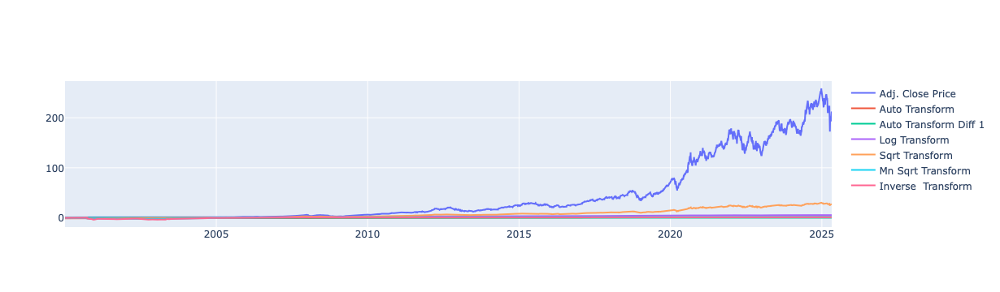

In [321]:
fig = Go.Figure()

fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"],name="Adj. Close Price"))
#Box Cox Transformations
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(auto_tf)[0],name="Auto Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(auto_tf)[0].diff(),name="Auto Transform Diff 1"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(log_tf)[0],name="Log Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(sqrt_tf)[0],name="Sqrt Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(mn_sqrt_tf)[0],name="Mn Sqrt Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(inv_tf)[0],name="Inverse  Transform"))
#fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(50).mean(),name="Adj. Close Price MA 50"))
#fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(100).mean(),name="Adj. Close Price MA 100"))
#fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(150).mean(),name="Adj. Close Price MA 150"))

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



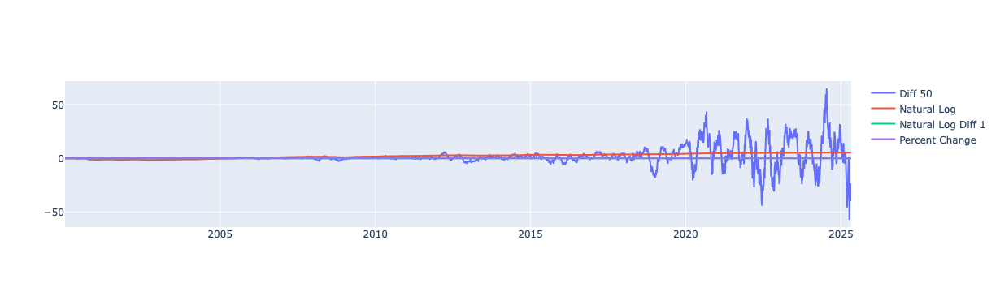

In [323]:
#Clearly the data is not stationary
#For Adjusted Price
fig = Go.Figure()
#Best One is percent Change
fig.add_trace(Go.Scatter(x=data["date"],y=data.diff(50)["adjClose"],name="Diff 50"))
fig.add_trace(Go.Scatter(x=data["date"],y=np.log(data["adjClose"]),name="Natural Log"))
fig.add_trace(Go.Scatter(x=data["date"],y=np.log(data["adjClose"]).diff(),name="Natural Log Diff 1"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].pct_change(),name="Percent Change"))


In [325]:
#Time Series Module
import statsmodels.tsa.api as tsa
#Time Series Plots Module
import statsmodels.graphics.tsaplots as tsap

Figure(640x480)


/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/2475487695.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/2475487695.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



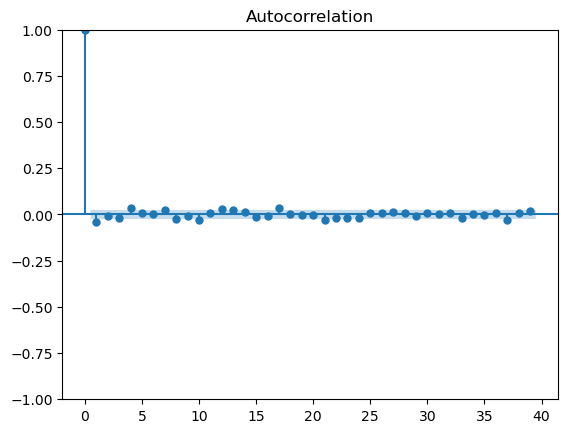

In [327]:
#Adjusted price percent change
data_pred = data[["date","adjClose"]]
data_pred["adjClose"] = data_pred["adjClose"].pct_change()
data_pred.dropna(inplace=True)

print(tsap.plot_acf(data_pred["adjClose"]))

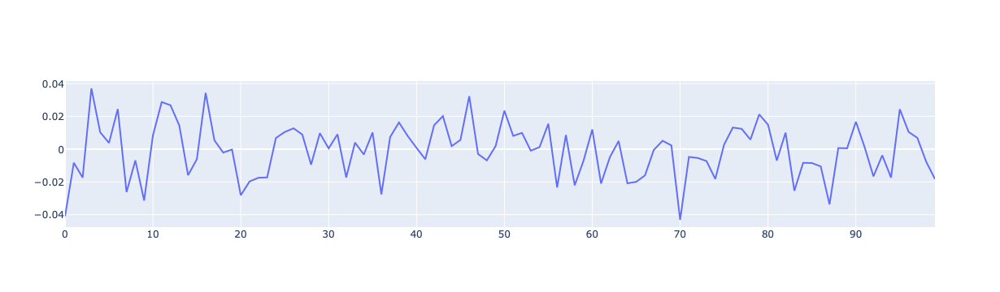

In [23]:
#To see the ACF Better extract the 0th index
#It shuts of after the first index which is the data itselt so no autocorrelation ??
fig = Go.Figure()
fig.add_trace(Go.Scatter(x=np.arange(0,len(tsa.acf(data_pred["adjClose"],nlags=100))), y=tsa.acf(data_pred["adjClose"],nlags=100)[1:]))

Figure(640x480)


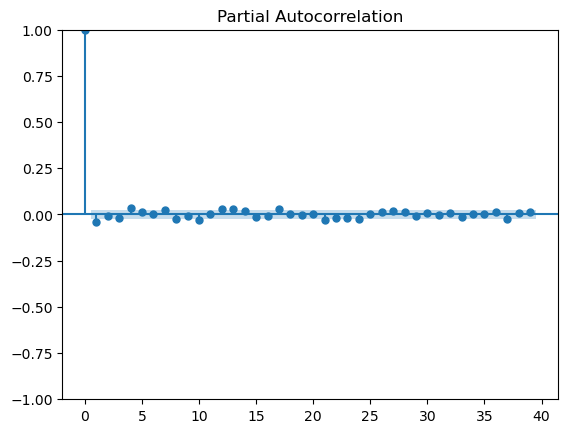

In [24]:
print(tsap.plot_pacf(data_pred["adjClose"]))

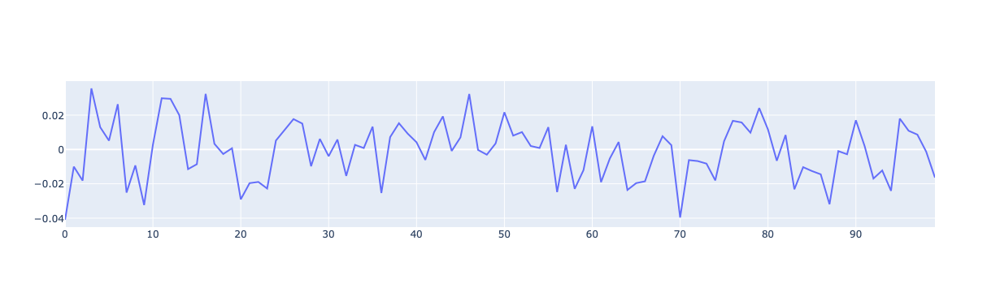

In [25]:
#To see the ACF Better extract the 0th index
#It shuts of after the first index which is the data itselt so no pacf ??
fig = Go.Figure()
fig.add_trace(Go.Scatter(x=np.arange(0,len(tsa.pacf(data_pred["adjClose"],nlags=100))), y=tsa.pacf(data_pred["adjClose"],nlags=100)[1:]))

## Base Model Trial

### Regression Based

In [268]:
#Try Linear Regression with MA feature
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
#Prepare Data
reg_trial_data = data[["date","adjClose"]]
reg_trial_data["MA7"] = data["adjClose"].rolling(7).mean()
reg_trial_data.dropna(inplace=True)
reg_trial_data.index = reg_trial_data["date"]
reg_trial_data.drop("date",axis=1,inplace=True)

X_train,X_test,y_train,y_test = train_test_split(reg_trial_data[["MA7"]],reg_trial_data[["adjClose"]],shuffle=False,test_size=0.10)
linear_model = LinearRegression()
linear_model.fit(X_train,y_train)
linear_model.score(linear_model.predict(X_test),y_test)

/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/1570157252.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/1570157252.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/1570157252.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

0.9795879566629736

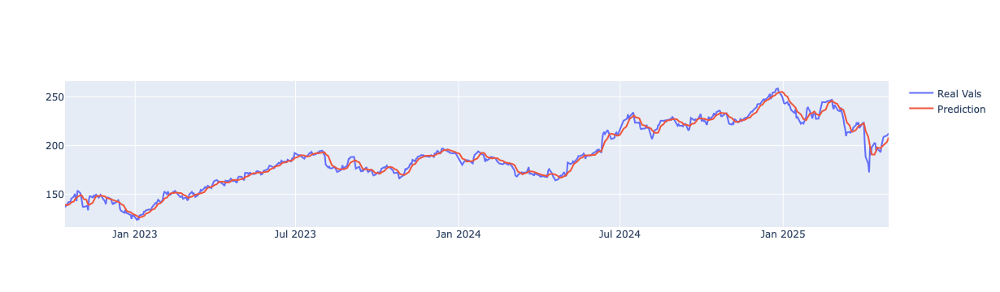

In [278]:
fig = Go.Figure()
fig.add_trace(Go.Scatter(x=X_test.index,y=y_test["adjClose"],name="Real Vals"))
fig.add_trace(Go.Scatter(x=X_test.index,y=pd.DataFrame(linear_model.predict(X_test))[0],name="Prediction"))

In [232]:
reg_trial_data

,adjClose,MA7
date,,
2000-01-11,0.697731,0.755968
2000-01-12,0.655905,0.729370
2000-01-13,0.727822,0.723190
2000-01-14,0.755581,0.719365
2000-01-18,0.781911,0.728972
...,...,...
2025-04-24,208.370000,199.894286
2025-04-25,209.280000,200.914286
2025-04-28,210.140000,203.181429


### Time Series Based

In [282]:
from pmdarima import auto_arima


In [306]:
#Try with Unprocessed data
#It is clearly not stationary only differencing can be done via autoarima
#However I know it is no useful as I tried above
ts_trial_data = data["adjClose"]
ts_trial_data.index = data["date"]

X_train_ss,X_test_ss, = train_test_split(ts_trial_data,shuffle=False,test_size=0.10)
arima_unprocessed_data = auto_arima(X_train_ss,max_p=15,max_d=10,max_q=25,max_order=100,njobs=-1,maxiter=100)

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1

In [307]:
arima_unprocessed_data.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 5733
Model:              SARIMAX(15, 2, 0)   Log Likelihood               -8099.644
Date:                Thu, 01 May 2025   AIC                          16231.287
Time:                        23:18:27   BIC                          16337.746
Sample:                             0   HQIC                         16268.343
                               - 5733                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9854      0.004   -225.050      0.000      -0.994      -0.977
ar.L2         -0.9502      0.006   -154.676      0.000      -0.962      -0.938
ar.L3         -0.9101      0.008   -117.255      0.000      -0.925      -0.895
ar.L4         -0.8313      0.009    -92.984      0.000      -0.849      -0.814
ar.L5         -0.7303      0.010    -72.621      0.000      -0.750      -0.711
ar.L6         -0.6757      0.011    -64.000      0.000      -0.696      -0.655
ar.L7         -0.5664      0.011    -51.951      0.000      -0.588      -0.545
ar.L8         -0.5649      0.011    -52.776      0.000      -0.586      -0.544
ar.L9         -0.4751      0.011    -44.906      0.000      -0.496      -0.454
ar.L10        -0.4291      0.010    -42.126      0.000      -0.449      -0.409
ar.L11        -0.2876      0.010    -28.677      0.000      -0.307      -0.268
ar.L12        -0.2273      0.009    -24.955      0.000      -0.245      -0.209
ar.L13        -0.1860      0.008    -22.801      0.000      -0.202      -0.170
ar.L14        -0.1254      0.007    -19.236      0.000      -0.138      -0.113
ar.L15        -0.0933      0.005    -19.639      0.000      -0.103      -0.084
sigma2         0.9884      0.005    196.237      0.000       0.979       0.998
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):            170740.65
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):            2289.96   Skew:                             0.02
Prob(H) (two-sided):                  0.00   Kurtosis:                        29.74
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [312]:
arima_unprocessed_data.predict(len(X_test_ss))

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



5733    139.520559
5734    138.422445
5735    137.960523
5736    138.204083
5737    137.545576
           ...    
6365    -93.390448
6366    -93.757529
6367    -94.124610
6368    -94.491691
6369    -94.858772
Length: 637, dtype: float64

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



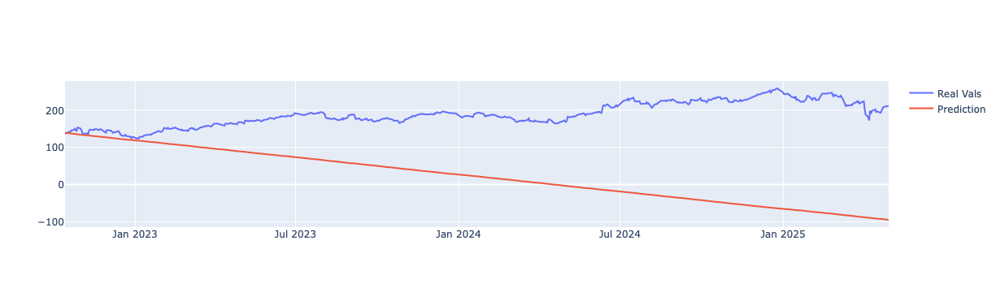

In [314]:
fig = Go.Figure()
fig.add_trace(Go.Scatter(x=X_test.index,y=y_test["adjClose"],name="Real Vals"))
fig.add_trace(Go.Scatter(x=X_test.index,y=pd.DataFrame(arima_unprocessed_data.predict(len(X_test_ss)))[0],name="Prediction"))